# НАЧАЛО

In [ ]:
# Подключаемся к Google Диску
from google.colab import drive
drive.mount('/content/drive')

# Импортируем необходимые библиотеки
import cv2    # импорт библиотекB cv2 для работы с компьютерным зрением и
from google.colab.patches import cv2_imshow   # функцию cv2_imshow из модуля google.colab.patches, которая позволяет отображать изображения в среде Google Colab.

import numpy as np
from PIL import Image   # модуль Image из библиотеки PIL, которая используется для работы с изображениями,
import os     # модуль os, который предоставляет функции для взаимодействия с операционной системой
import torch    # импорт библиотеки PyTorch
# Устанавливаем пакет ultralytics для работы с YOLO
!pip install ultralytics
# Импортируем класс YOLO из модуля ultralytics
from ultralytics import YOLO

!pip install -q jupyter_bbox_widget     # Пакет jupyter_bbox_widget предоставляет виджеты для Jupyter Notebook, которые позволяют аннотировать изображения с помощью рамок.
import base64     # Модуль base64 используется для кодирования и декодирования данных в формате Base64, что может быть полезно при работе с изображениями или другими двоичными данными.
                                        #
import matplotlib.pyplot as plt         #
import time
# Создаем папку для сохранения кадров
frames_folder = '/content/drive/MyDrive/Стажировка/frame'
os.makedirs(frames_folder, exist_ok=True)

# Загружаем модель YOLO
model_path = 'yolov8n.pt'  # Укажите путь к модели
yolo_model = YOLO(model_path)

Mounted at /content/drive
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.0/793.0 kB 8.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvt

100%|██████████| 6.23M/6.23M [00:00<00:00, 109MB/s]


In [ ]:
# Функция для сохранения кадров
def save_frame(frame, count):
  frame_name = f'frame{count:04d}.jpg'
  frame_path = os.path.join(frames_folder, frame_name)
  cv2.imwrite(frame_path, frame)

# вспомогательная функция, которая загружает изображение перед добавлением его в виджет
def encode_image(filepath):
    with open(filepath, 'rb') as f:
        image_bytes = f.read()
    encoded = str(base64.b64encode(image_bytes), 'utf-8')
    return "data:image/jpg;base64,"+encoded

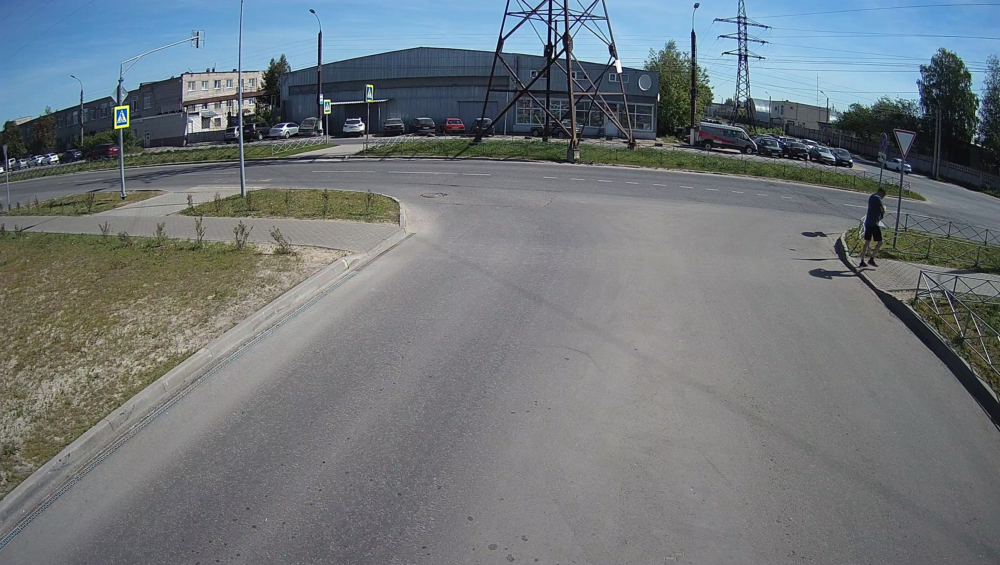

In [ ]:
# Получение первого кадра из видео
url = '/content/drive/MyDrive/Стажировка/10.121.15.248_01_20240524052132117_18.mp4'      # Задаем путь к видеофайлу

cap = cv2.VideoCapture(url)     # Создаем объект VideoCapture для чтения видео
if cap.isOpened():      # Проверяем, открылся ли файл видео
  ret, frame = cap.read()     # Читаем первый кадр
if ret:
  cv2_imshow(frame)     # Показываем кадр
  cv2.imwrite('/content/first_frame.jpeg', frame)     # Сохраняем кадр в файл
else:
  print("Не удалось прочитать кадр из видео.")
cap.release()     # Освобождаем объект VideoCapture

In [ ]:
# Код используется для работы с виджетами в Jupyter Notebook, запущенном в Google Colab.
IS_COLAB = True   # Эта строка устанавливает переменную IS_COLAB в значение True. Это обычно делается для проверки, выполняется ли код в среде Google Colab.
if IS_COLAB:   # Этот блок кода выполняется только если переменная IS_COLAB истинна. В данном случае, если код запущен в Colab, он импортирует модуль output и
               # активирует менеджер пользовательских виджетов, который позволяет использовать пользовательские виджеты в Colab.
    from google.colab import output   # Эта строка импортирует модуль output из библиотеки google.colab. Модуль output предоставляет функции для управления выводом в ноутбуках Colab.
    output.enable_custom_widget_manager()   # Эта функция активирует менеджер пользовательских виджетов в Colab. Это необходимо для того, чтобы пользовательские виджеты,
                                            # такие как BBoxWidget из библиотеки jupyter_bbox_widget, могли отображаться и функционировать корректно в среде Colab.
from jupyter_bbox_widget import BBoxWidget   # Импортируется класс BBoxWidget из библиотеки jupyter_bbox_widget, который позволяет создавать интерактивные виджеты для аннотации изображений с помощью рамок.
name_classes = ['Область поиска авто']   # Создается список с названиями классов, которые будут использоваться в виджете для аннотации. В данном случае есть только один класс — "Область поиска авто".
widget = BBoxWidget(classes= name_classes)   # Создается экземпляр виджета BBoxWidget с указанными классами для аннотации.
widget.image = encode_image("/content/first_frame.jpeg")   # Изображение кодируется в формат, совместимый с виджетом, и устанавливается в качестве изображения для виджета.
print('отметьте координаты области слежения на фото')
widget   # Отображается созданный виджет, позволяющий пользователю взаимодействовать с изображением и устанавливать рамки вокруг объектов интереса.

отметьте координаты области слежения на фото


BBoxWidget(classes=['Область поиска авто'], colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8…

In [ ]:
print("Программа приостановлена чтобы ввести область поиска. Нажмите Enter, чтобы продолжить...")
input()
#input ('После задания области поиска нажмите клавишу  Enter ', )

Программа приостановлена чтобы ввести область поиска. Нажмите Enter, чтобы продолжить...



''

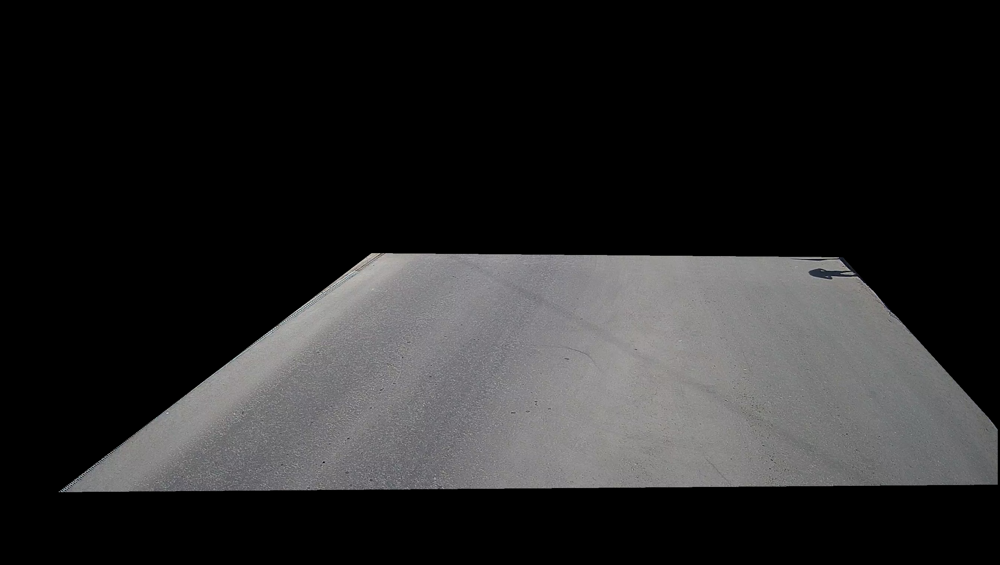

In [ ]:
# Отображение зоны интереса
image_path = '/content/first_frame.jpeg'  # Чтение изображения
image = cv2.imread(image_path)
polygon = np.array([[pt['x'], pt['y']] for pt in widget.bboxes], dtype=np.int32)   # Извлечение координат точек
mask = np.zeros(image.shape[:2], dtype=np.uint8)   # Создание пустой маски
cv2.fillPoly(mask, [polygon], 255)   # Заполнение маски на основе полигона
result = cv2.bitwise_and(image, image, mask=mask)   # Применение маски к изображению
output_path = 'result_image.jpg'    # Сохранение результата
cv2.imwrite(output_path, result)
cv2_imshow(result)    # Показать результат

In [ ]:
# Создаем папку для сохранения кадров
frames_folder = '/content/drive/MyDrive/Стажировка/frame'
os.makedirs(frames_folder, exist_ok=True)

In [ ]:
# Парсер
video_path = url
cap = cv2.VideoCapture(video_path)      # Открытие видеопотока
count = 0     # Счетчик кадров
end_film = 0    # Счетчик последних кадров
saved_frames = 0   # Счетчик сохраненных кадров
start_time = time.time()
# Проверяем, открылся ли файл
if not cap.isOpened():
    print("Error opening video file")
    #return
while cap.isOpened():       # Цикл для обработки каждого кадра видео
  ret, frame = cap.read()
  if not ret:            # Если кадр не прочитан, то счетчик плохих кадров увеличиваем на 1
    print("Ошибка чтения видео или конец файла")
    break
# Обрабатываем каждый пятый кадр
  if count % 5 == 0:
    print(f'\rСчетчик кадров: {count}', end='')
    # Заполняем маску полигоном. Функция cv2.fillPoly принимает список полигонов
    cv2.fillPoly(mask, [np.array(polygon, dtype=np.int32)], 255)
    # Применяем маску к исходному изображению
    roi_frame = cv2.bitwise_and(frame, frame, mask=mask)
    # Применяем модель YOLO для детекции автомобилей в заданной области
    # results = yolo_model(roi_frame, classes=2)
    results = yolo_model.predict(roi_frame, conf=0.4, classes=2, verbose=False )    # verbose=False сообщения об обнаружении объектов не отображаются
    boxes = results[0].boxes.cls  # Объект Box с атрибутами - cls: тензор, содержащий номера классов для каждого обнаружения. conf: тензор, содержащий вероятности уверенности для каждого обнаружения.
                              # data: тензор, содержащий сырые данные о рамках обнаружения. orig_shape: кортеж, содержащий исходную форму изображения в формате (высота, ширина).
                              # shape: размер тензора data. xywh: тензор, содержащий координаты рамок обнаружения в формате x, y, w, h.
                              # x и y - это координаты центра рамки, w и h - ширина и высота рамки.     Координаты измеряются в пикселях и относятся к исходному изображению.
                              # xywhn: тензор, содержащий координаты рамок обнаружения в формате x, y, w, h, но нормализованные.
                              # Это означает, что координаты делятся на ширину и высоту исходного изображения, чтобы получить значения от 0 до 1.
                              # Это полезно для сравнения рамок на разных изображениях с разными размерами.
                              # xyxy: тензор, содержащий координаты рамок обнаружения в формате x1, y1, x2, y2. Это то же самое, что и в атрибуте data, но без вероятностей уверенности и номеров классов.
                              # xyxyn: тензор, содержащий координаты рамок обнаружения в формате x1, y1, x2, y2, но нормализованные. Это то же самое, что и в атрибуте xywhn, но с другим форматом координат.

# Обрабатываем кадр, если есть авто сохраняем кадр
    # Проверка наличия класса 2 в тензоре classes.
    if (boxes == 2).any():         # Метод any() в Python используется для проверки, содержит ли итерируемый объект (например, список, тензор или массив) хотя бы один элемент, который оценивается как True.
      print("Класс 2 есть")
      saved_frames +=1             # счетчик сохраненных кадров
    # Сохраняем кадр
      save_frame(frame, count)
    else:
      #print("Класс 2 нет")
      print()
    #print(boxes)
  count += 1

cap.release()   # Этот метод освобождает камеру, что позволяет другим приложениям использовать её.
cv2.destroyAllWindows()   # Закрытие всех окон OpenCV.


Счетчик кадров: 0
Счетчик кадров: 5
Счетчик кадров: 10
Счетчик кадров: 15
Счетчик кадров: 20
Счетчик кадров: 25
Счетчик кадров: 30
Счетчик кадров: 35
Счетчик кадров: 40
Счетчик кадров: 45
Счетчик кадров: 50
Счетчик кадров: 55
Счетчик кадров: 60
Счетчик кадров: 65
Счетчик кадров: 70
Счетчик кадров: 75
Счетчик кадров: 80
Счетчик кадров: 85
Счетчик кадров: 90
Счетчик кадров: 95
Счетчик кадров: 100
Счетчик кадров: 105
Счетчик кадров: 110
Счетчик кадров: 115
Счетчик кадров: 120
Счетчик кадров: 125
Счетчик кадров: 130
Счетчик кадров: 135
Счетчик кадров: 140
Счетчик кадров: 145
Счетчик кадров: 150
Счетчик кадров: 155
Счетчик кадров: 160
Счетчик кадров: 165
Счетчик кадров: 170
Счетчик кадров: 175
Счетчик кадров: 180
Счетчик кадров: 185
Счетчик кадров: 190
Счетчик кадров: 195
Счетчик кадров: 200
Счетчик кадров: 205
Счетчик кадров: 210
Счетчик кадров: 215
Счетчик кадров: 220
Счетчик кадров: 225
Счетчик кадров: 230
Счетчик кадров: 235
Счетчик кадров: 240
Счетчик кадров: 245
Счетчик кадров: 250
Сч

обработка видео завершена, сохранено 0 кадров
длительность исходного видео: 0 минут 0 секунд
время обработки: 1 минут 55 секунд
всего обработано кадров: 3926
сохранено кадров: 0


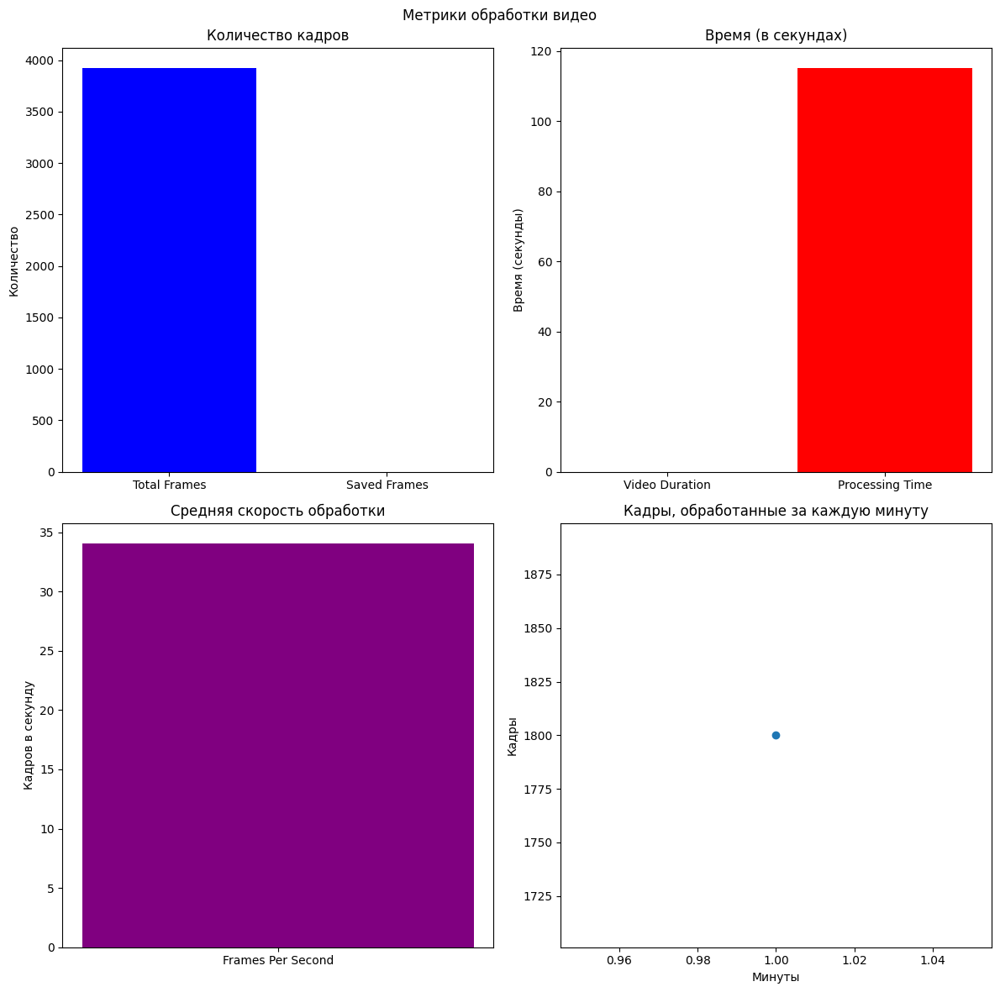

In [ ]:
# Метрики
end_time = time.time()
processing_time = end_time - start_time

# конвертация времени обработки в минуты и секунды
processing_minutes = int(processing_time // 60)
processing_seconds = int(processing_time % 60)

# метрики
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS)) if cap.get(cv2.CAP_PROP_FPS) > 0 else 30  # Задаем стандартное значение FPS, если не удалось получить его из видео
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
# Проверяем, что fps больше нуля, чтобы избежать деления на ноль
if fps > 0:
  duration = total_frames / fps

# конвертация длительности в минуты и секунды
duration_minutes = int(duration // 60)
duration_seconds = int(duration % 60)

print(f"обработка видео завершена, сохранено {saved_frames} кадров")
print(f"длительность исходного видео: {duration_minutes} минут {duration_seconds} секунд")
print(f"время обработки: {processing_minutes} минут {processing_seconds} секунд")
print(f"всего обработано кадров: {count}")
print(f"сохранено кадров: {saved_frames}")

# создание графиков
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

# график 1: количество обработанных и сохраненных кадров
ax[0, 0].bar(['Total Frames', 'Saved Frames'], [count, saved_frames], color=['blue', 'green'])
ax[0, 0].set_title('Количество кадров')
ax[0, 0].set_ylabel('Количество')

# график 2: длительность видео и время обработки
ax[0, 1].bar(['Video Duration', 'Processing Time'], [duration, processing_time], color=['orange', 'red'])
ax[0, 1].set_title('Время (в секундах)')
ax[0, 1].set_ylabel('Время (секунды)')

# график 3: средняя скорость обработки кадров
ax[1, 0].bar(['Frames Per Second'], [count / processing_time], color=['purple'])
ax[1, 0].set_title('Средняя скорость обработки')
ax[1, 0].set_ylabel('Кадров в секунду')

# график 4: количество кадров, обработанных за каждую минуту
minutes = np.arange(1, int(duration // 60) + 2)
frames_per_minute = [min(60 * fps, count - i * 60 * fps) for i in range(len(minutes))]
ax[1, 1].plot(minutes, frames_per_minute, marker='o', linestyle='-')
ax[1, 1].set_title('Кадры, обработанные за каждую минуту')
ax[1, 1].set_xlabel('Минуты')
ax[1, 1].set_ylabel('Кадры')

plt.suptitle('Метрики обработки видео')
plt.tight_layout()
plt.show()